In [136]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [137]:
import pandas as pd
import os
import re
from ast import literal_eval
import numpy as np

pd.set_option('display.max_rows', 250)
pd.set_option('display.max_colwidth', 500)

In [138]:
from heuristics.model.utils import plot_imgs_with_labels, load_images
from heuristics.heuristics import catalog_flag, calculate_text_heuristics

In [139]:
HEUR_IMG_DIR = 'data/heuristics_images/'

In [140]:
dress_room_df = pd.read_csv('heuristics/data/heuristics_cabinet.csv')

In [141]:
dress_room_df.columns

Index(['image_id_ext', 'item_id_ext', 'microcat_name', 'title', 'description',
       'crop_coords', 'crop_area', 'is_catalog', 'n_texts', 'person_found',
       'perform_top_microcat_value', 'perform_top_microcat_name',
       'perform_top_microcat_prob', 'perform_top_other_classes_value',
       'perform_top_other_classes_prob', 'image'],
      dtype='object')

### Основные поля
'image_id_ext' - id изображения,

'item_id_ext' - id объявления к которому относится изображение,

'title' - заголовок объявления,

'description' - описание объявления,

'microcat_name' - категория объявления,

'image' - сслыка на изображение

### Выходы модели Smart-crop
'crop_coords' - координаты кропа,

'crop_area' - площадь кропа,

'is_catalog' - является ли изображение каталожным,

### Выход модели text_detector
'n_texts' - кол-во областей с текстом на изображении,

### Выход модели по поиску лиц
'person_found' - есть ли человек на изображении

### Выход модели Perform
'perform_top_microcat_value' - предсказание id микрокатегории изображения в виде

'perform_top_microcat_name' - соответствующее название микрокатегории

'perform_top_microcat_prob' - вероятность предсказанной микрокатегории

'perform_top_other_classes_value' - предсказание на другую группу классов

'perform_top_other_classes_prob' - вероятность предсказания

In [142]:
dress_room_df.head(2)[['microcat_name', 'image', 'title', 'description']]

,microcat_name,image,title,description
0,Компьютерные столы и кресла,http://labelimages.avito.ru/1719903050.jpg,Стенка,"Стенка для книг со стеклом, удобная для хранения детских книг и учебников, очень прочная и красивая, в наличии есть 3-секции.каждая по 1500"
1,Компьютерные столы и кресла,http://labelimages.avito.ru/15944980896.jpg,Прихожая,"Прихожая Ксения 2\n Габариты (ШхВхГ): 1200×2150×364 мм\n \nМатериал ЛДСП.\n \nОтличается малыми габаритами, но достаточной шириной для того, чтобы вместить в себя минимум необходимых секций. Поможет правильно организовать пространство прихожей и эффектно оформить малую по площади входную зону.\n \nДоставка по Москве и области 800 рублей;\n \n✔ Мебельный Склад Москва - огромный ассортимент корпусной мебели с доставкой по Москве и области!\n \n✔ 70% мебели всегда в наличии на наших складах!..."


In [143]:
# %%time
# если не тут не скачивается, то лучше взять картинки с гугл диска
# image_paths = load_images(dress_room_df['image'], HEUR_IMG_DIR)

In [144]:
dress_room_df['img_path'] = dress_room_df['image_id_ext'].map(
    lambda x: os.path.join(HEUR_IMG_DIR, f'{int(x)}.jpg')
)

## Смотрим на данные

In [145]:
dress_room_df['microcat_name'].value_counts()

Компьютерные столы и кресла    20451
Name: microcat_name, dtype: int64

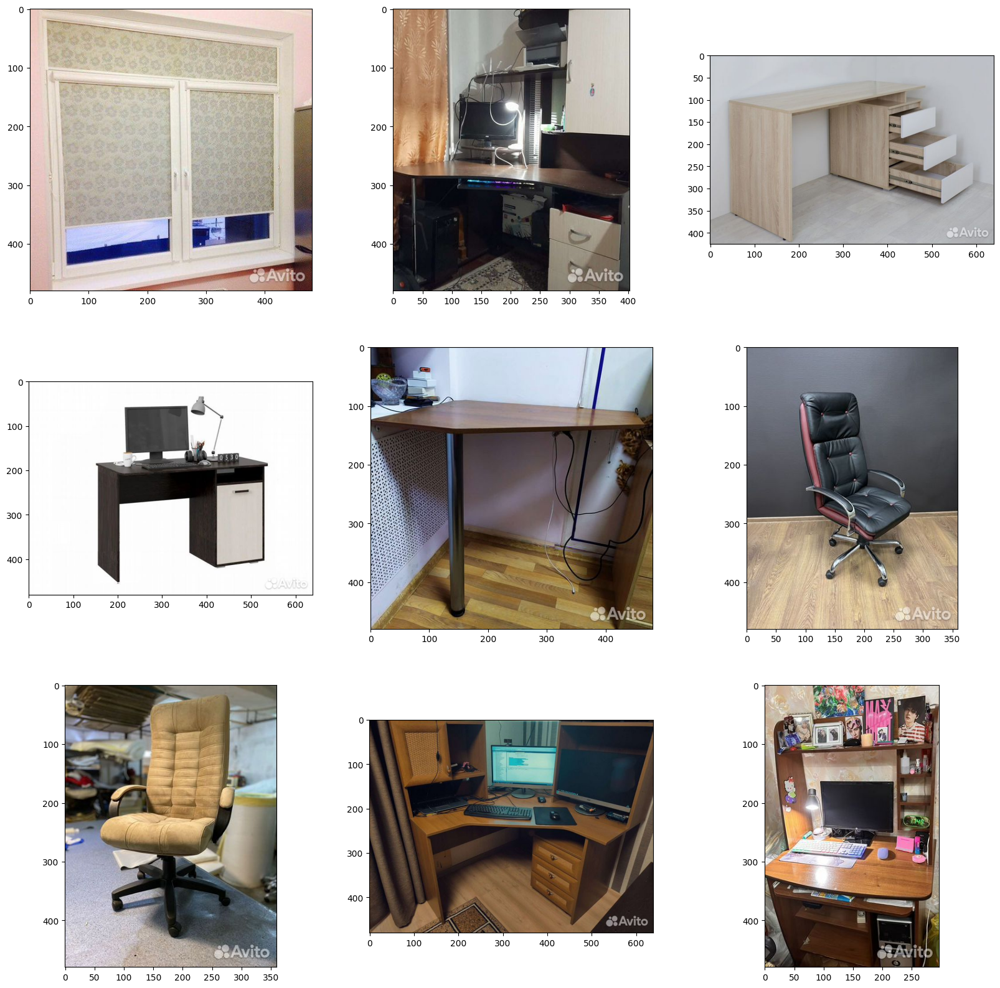

In [146]:
sample_df = dress_room_df.sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [147]:
sample_df[['title', 'description']]

,title,description
0,Жалюзи,Жалюзи и рулонные шторы \nОт производителя \nВыбор большой \nВыезжаем со всеми каталогами на дом \nОбслуживаем все села и города по Кбр \nУстановка и доставка беспл
1,Компьютерный стол,Продам компьютерный стол в хорошем состоянии
2,Стол письменный в наличии отличное качество,"Цены снижены до конца месяца😱 Успей купить🔥Качество и комфорт новой мебели по цене «бу» в наличии и ждет вас. Быстрая доставка в удобный вам день. Гарантия 2 года и срок службы мебели 20 лет. Цена реальная. Оплата при получении.\nЧто еще нужно для счастья ? Подарок !\n• Для того что бы получить скидку 300 рублей на первый заказ, напишите нам в личные сообщения на Авито «Хочу скидку»\nПодробности в описании под видео ✅\n\nМы работаем без физических магазинов и салонов.\nЗа счет этого у нас пр..."
3,Письменный стол,Компактный и удобный прямой письменный стол с тумбой Смайл.\n\nГабаритный размер мм\n\nШирина 1200\n\nВысота 760\n\nГлубина 590\n\nКорпус ЛДСП Венге\n\nФасад ЛДСП Дуб светлый\n\nПродается в разобранном виде!\n\nВозможна отправка яндекс такси.\n\nЕще больше выбора в нашем салоне мебели!\n\nПриходите! Будем рады Вас видеть!
4,Стол угловой,Продам стол угловой в хорошем состоянии
5,Компьютерное кресло. Доставка,"Компьютерное кресло. Доставка \n\nМы производители. Вы можете приобрести офисные кресла у нас – быстро и без лишних наценок! Мы гарантируем качество и долговечность. Работаем с 2014 года.\n📲 Проще позвонить, чем размышлять. \n\n- Доставка в день заказа по Москве;\n- Любая удобная форма оплаты;\n- Работаем с лучшими производителями материалов и фурнитуры, профессиональный дизайн и высококлассное производство;\n- Мы осуществляем гарантийный ремонт в течении 1 года , а также послегарантийный;\n..."
6,Компьютерное кресло,"Кресло компьютерное Атлант МП.\n \nОт производителя, новое\n \nВ связи с нестабильной ситуацией на валютном рынке просьба актуальность цены уточнять у менеджера !!!\n \nИзготовим в любом материале и комплектации.\n \nХарактеристики:\n \nНагрузка: до 120 кг\n \nМатериал обивки: эко-кожа и ткань\n \nМеханизм: газ-лифт и топ-ган\n \nКачание: да\n \nКрестовина: прочный пластик\n \nПочему нужно заказать у нас ?\n \nГарантия: 12 месяцев\n \nМы производим широкий спектр рабочих, офисных и компьютер..."
7,Компьютерный стол,Угловой Компьютерный Стол 120 на 120. Высота 140. Глубина от 60 до 100 см. \nТумбочка на 3 полки
8,Компьютерный стол б/у,Стол для компьютера


## Регулярки

In [148]:
regexp1 = re.compile(r'.')
regexp1 = re.compile(r'стол')
include_re = [regexp1]

not_regexp1 = re.compile(r'заказ')
not_regexp2 = re.compile(r'доставка')
not_regexp3 = re.compile(r'производител')
not_regexp4 = re.compile(r'механизм мэо')
not_regexp5 = re.compile(r'подлокотник')
not_regexp6 = re.compile(r'для администратор')
exclude_re = [not_regexp1, not_regexp2, not_regexp3, not_regexp4, not_regexp5, not_regexp6]

In [149]:
dress_room_df = calculate_text_heuristics(dress_room_df, include_re, exclude_re=exclude_re)

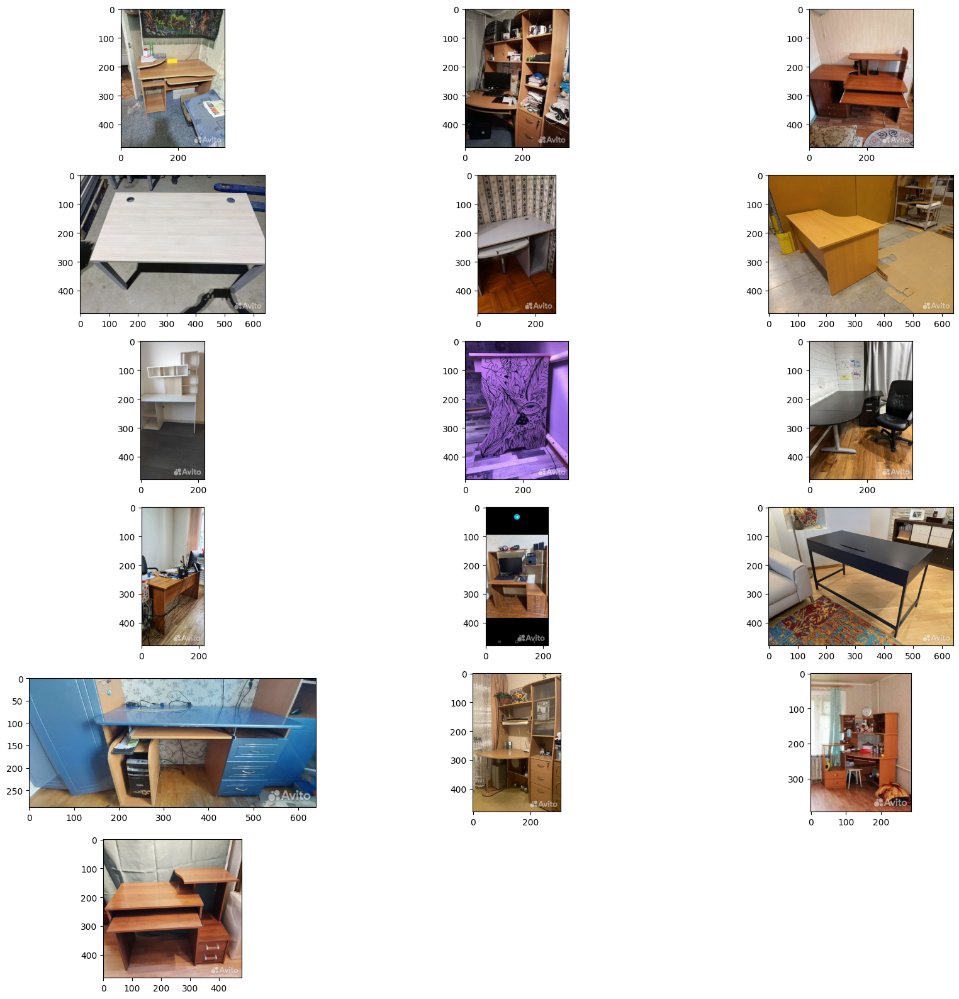

In [150]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [151]:
sample_df[['title', 'description']]

,title,description
0,Компьютерный стол бу,Стол б/ у
1,Комьютерный стол,Компьютерный стол
2,Компьютерный стол бу,"Продам компьютерный стол б/у, в хорошем состоянии. Цена 1500р."
3,Стол компьютерный,Продам стол \nРазмеры \nШирина 120\nГлубина 70\nВысота 75\nОснование разборное! \nСтолешницы в хорошем состоянии!\nНа ногах присутствуют дефекты!\nСтоимость зависит от состояния Ног от 3500до 5000!\nВ наличии 7шт
4,Компьютерный стол,Продаётся компьютерный стол.
5,Стол эргономичный левый,"DLT 128S005 Стол эргономичный левый (140*90h75) (бук бавария)\nКод товара : 8#59866\n-Остаток на складе на 1.12.2022- 26 шт\n\nраспродажа в связи с тем ,что фабрика больше не производит данную серию ,распродажа остатков , цены - ниже себестоимости .\n\nТовар НОВЫЙ ,в заводской упаковке ! серийное производство ,не гаражное !!"
6,Компьютерный стол новый,"Срочно продам компьютерный стол,новый"
7,Письменный стол бу,"Декорированный письменный стол, ручная роспись. Светодиодная лента входит в стоимость. Только самовывоз."
8,Компьютерный стол офисный стол,Стол компьютерный IKEA
9,Стол офисный бу,"В связи с переездом продается офисный стол, срочно.\n- длина - 115, ширина - 54, высота - 75 см.\nМебель в хорошем состоянии, стоимость, 1 тр."


# Внешние данные - модели

## 1. Perform

In [152]:
dress_room_df[['image', 'perform_top_microcat_name', 'perform_top_microcat_prob', 
               'perform_top_other_classes_value', 'perform_top_other_classes_prob']]

,image,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob
0,http://labelimages.avito.ru/1719903050.jpg,"Шкафы, комоды и стеллажи",0.675855,Скриншоты переписок,0.007900
1,http://labelimages.avito.ru/15944980896.jpg,"Шкафы, комоды и стеллажи",0.617563,Скриншоты переписок,0.014560
2,http://labelimages.avito.ru/15951929862.jpg,"Шкафы, комоды и стеллажи",0.618218,Скриншоты переписок,0.014306
3,http://labelimages.avito.ru/15947704994.jpg,"Шкафы, комоды и стеллажи",0.380578,Кухня,0.090922
4,http://labelimages.avito.ru/15944689222.jpg,"Шкафы, комоды и стеллажи",0.375180,Кухня,0.207469
...,...,...,...,...,...
20446,http://labelimages.avito.ru/16060170293.jpg,Товары для купания,0.121134,Скриншоты переписок,0.022792
20447,http://labelimages.avito.ru/16061861381.jpg,Курильский бобтейл,0.308277,Планировка,0.001674
20448,http://labelimages.avito.ru/15847630796.jpg,Nokia,0.442986,Скриншоты переписок,0.004236
20449,http://labelimages.avito.ru/16062494362.jpg,Рулевое управление,0.180668,Алкоголь,0.008176


In [153]:
dress_room_df['perform_top_microcat_name'].value_counts()[:10]

Компьютерные столы и кресла    15626
Ресепшены и офисная мебель      1192
Для салона красоты              1080
Столы и стулья                   999
Подставки и тумбы                164
Шкафы, комоды и стеллажи         127
Другое                           124
Кухонные гарнитуры               121
Аксессуары                        85
Детская мебель                    83
Name: perform_top_microcat_name, dtype: int64

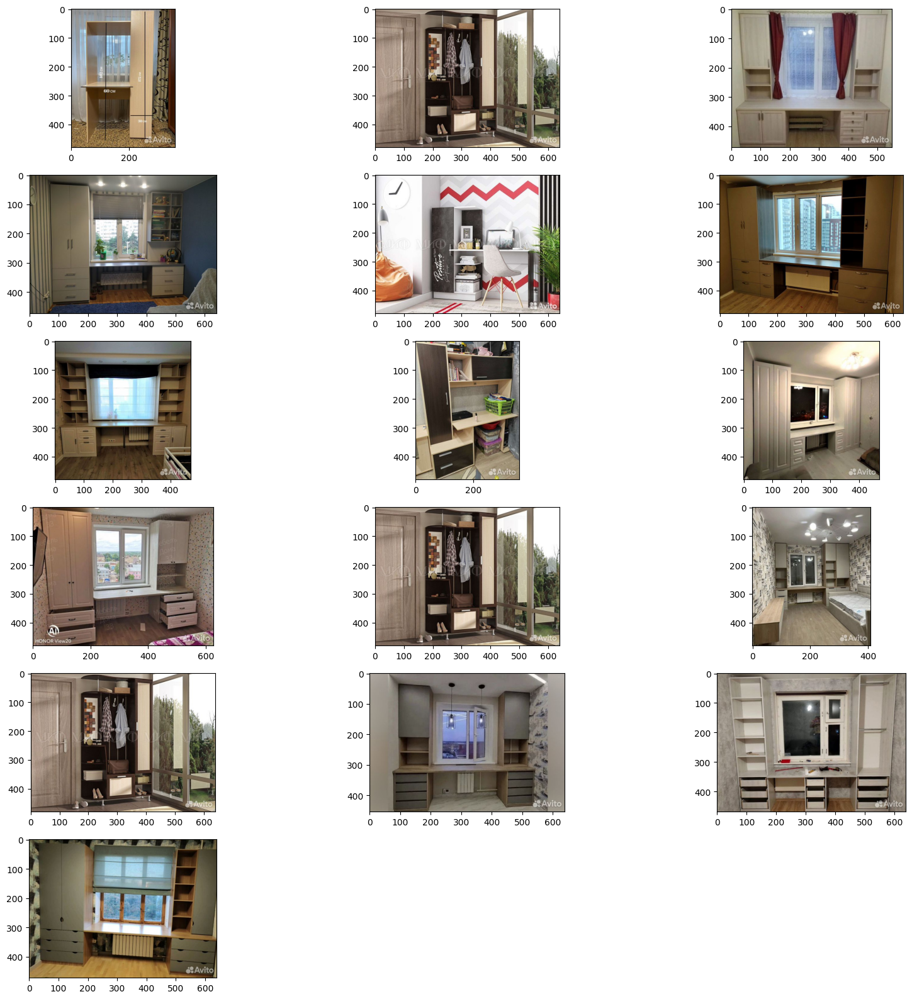

In [154]:
sample_df = dress_room_df[(dress_room_df['perform_top_microcat_name'] == 'Шкафы, комоды и стеллажи') & (
    dress_room_df['perform_top_microcat_prob'] >= 0.1)].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 2. Text detector 
Определяет область с текстом на картинке

Мы будем просто считать кол-во таких областей

In [155]:
dress_room_df['n_texts'].value_counts()

1     11971
0      6333
2       782
4       433
3       237
5       149
9       140
6        98
7        71
8        37
12       30
10       29
14       25
11       21
13       16
16       13
15       11
23       10
17        7
24        5
26        3
20        3
28        3
27        3
34        3
18        3
19        2
21        2
30        2
42        2
32        2
39        1
22        1
29        1
31        1
52        1
Name: n_texts, dtype: int64

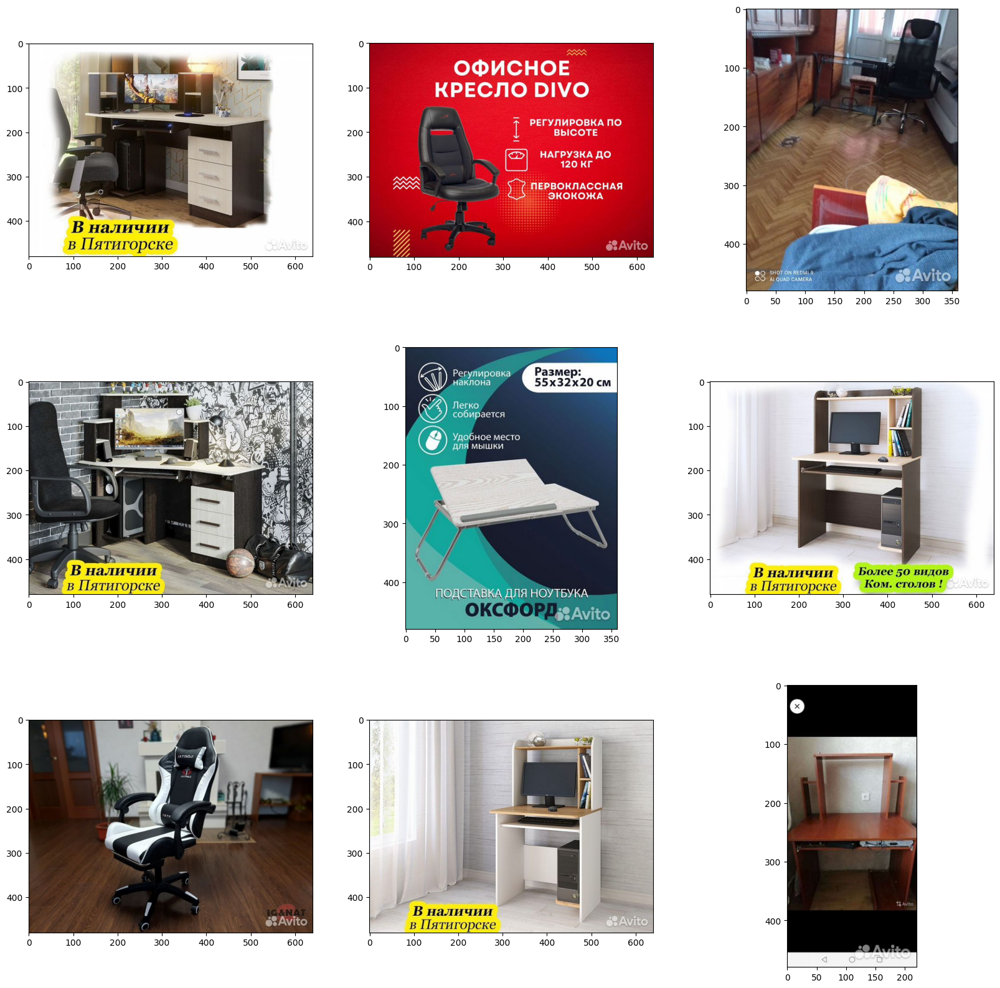

In [156]:
sample_df = dress_room_df[dress_room_df['n_texts'] >= 3].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 3. Smart crop

In [157]:
dress_room_df[['crop_coords', 'crop_area', 'is_catalog']]

,crop_coords,crop_area,is_catalog
0,"[0.314453125, 0.0243682861328125, 0.8001301884651184, 0.95458984375]",0.451787,False
1,"[0.1887206882238388, 0.0375976525247097, 0.7578124403953552, 0.9472655653953552]",0.517685,False
2,"[0.1883544772863388, 0.0375976525247097, 0.7592772841453552, 0.9472655653953552]",0.519350,False
3,"[0.0496826171875, 0.10622944682836533, 0.9462890625, 0.9606277942657471]",0.766059,False
4,"[0.1453857421875, 0.05433617904782295, 0.75634765625, 0.8338355422019958]",0.476244,False
...,...,...,...
20446,"[0.02685546875, 0.0994873046875, 0.962890625, 0.841796875]",0.694828,False
20447,"[0.1242675706744194, 0.18460692465305328, 0.9672850966453552, 0.6357238292694092]",0.380299,False
20448,"[0.24939066171646118, 0.12548828125, 0.8376131653785706, 0.94873046875]",0.484250,False
20449,"[0.140869140625, 0.2961864471435547, 0.87109375, 0.7919491529464722]",0.362018,False


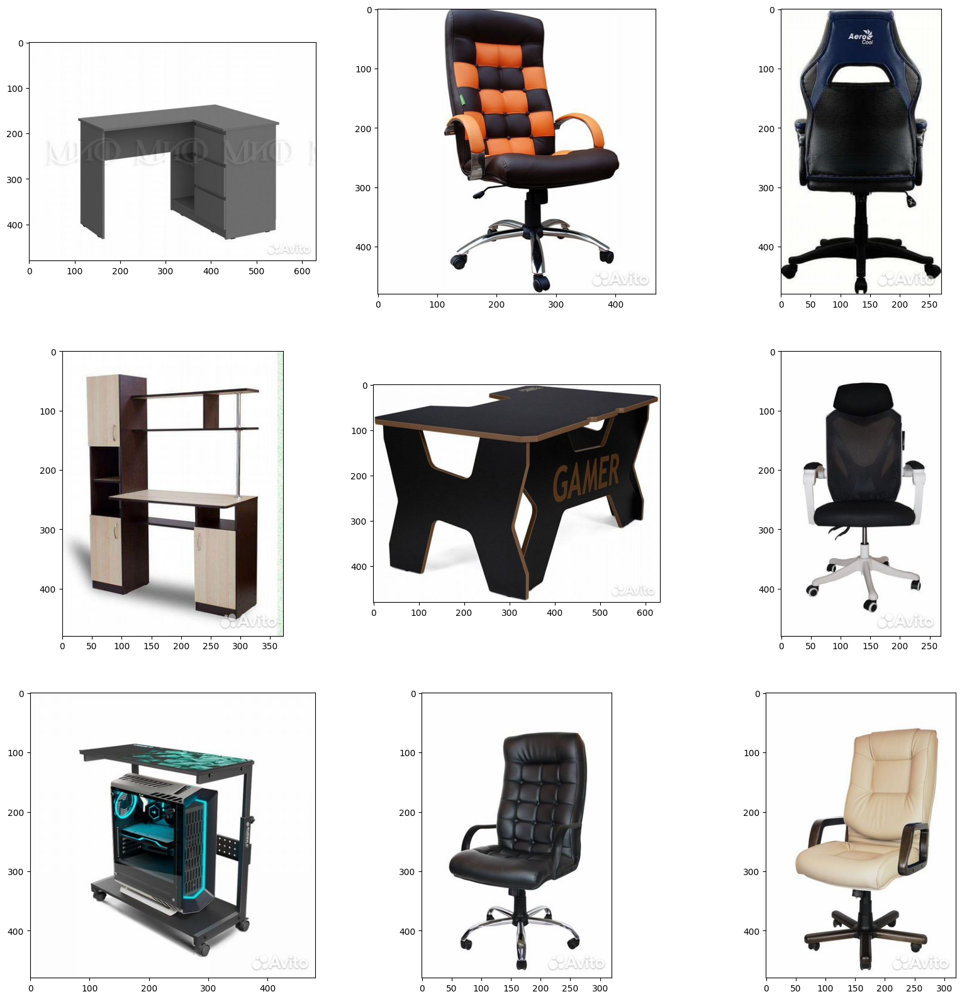

In [158]:
sample_df = dress_room_df[dress_room_df['is_catalog'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## Модель распознавания лиц

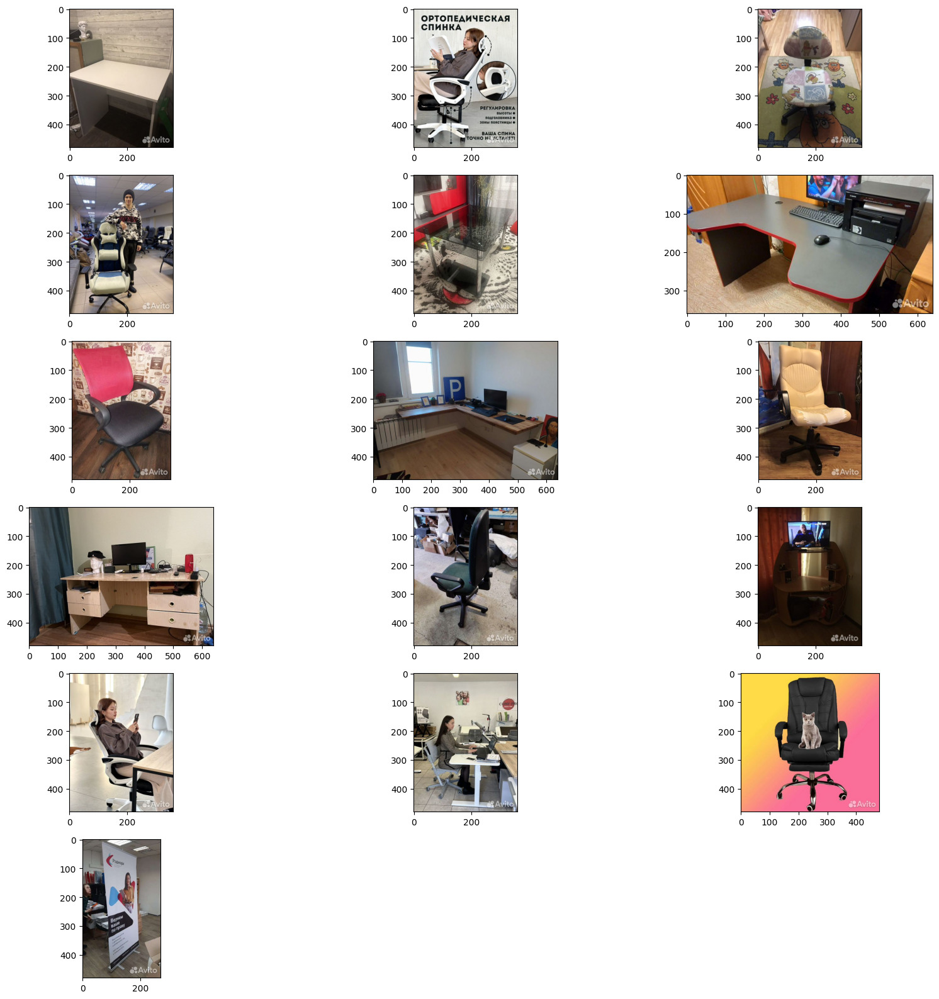

In [159]:
sample_df = dress_room_df[dress_room_df['person_found'] == True].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [160]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].shape

(5498, 19)

In [161]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)].shape

(4833, 19)

In [162]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].shape

(4809, 19)

In [163]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)
             ].to_csv('new_data/heur_cabinet.csv', index=False)

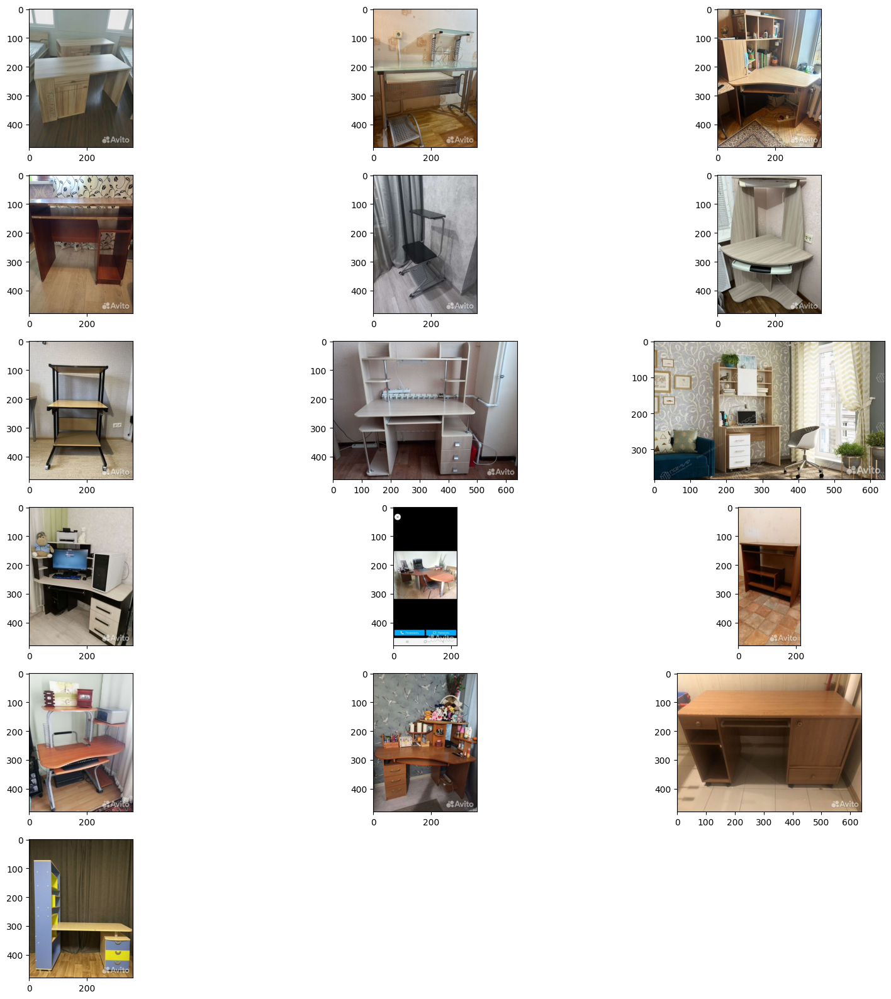

In [164]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        )].sample(16).reset_index()

plot_imgs_with_labels(sample_df['img_path'])

In [165]:
sample_df

,index,image_id_ext,item_id_ext,microcat_name,title,description,crop_coords,crop_area,is_catalog,n_texts,person_found,perform_top_microcat_value,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob,image,img_path,title_match,description_match
0,15674,16063159782,2664507354,Компьютерные столы и кресла,Ларго Стол письменный Дуб Рокпайл,"Стол письменный\n\n1230*750*500\n\nСовременная мебель для подростковой комнаты ЛАРГО настолько универсально, что идеально впишется в любую цветовую гамму, обои. Дополнив интерьер акцентами, вы можете сменить настроение комнаты, что так важно для растущего подроста.","[0.021960942074656487, 0.1947021335363388, 0.9812474250793457, 0.8461913466453552]",0.624965,False,1,False,243,Компьютерные столы и кресла,0.349714,Дети,0.003221,http://labelimages.avito.ru/16063159782.jpg,data/heuristics_images/16063159782.jpg,1,1
1,10407,16018330755,2722614058,Компьютерные столы и кресла,Компьютерный стол стеклянный,"Стол в хорошем состоянии, продаем в связи с переездом. \n\nширина 120\nГлуб 60\nВыс 74 + полка 33 см","[0.02734375, 0.10400390625, 0.9661458134651184, 0.9755859375]",0.818243,False,1,False,243,Компьютерные столы и кресла,0.768926,Скриншоты переписок,0.005184,http://labelimages.avito.ru/16018330755.jpg,data/heuristics_images/16018330755.jpg,1,1
2,4377,15968181728,2655389001,Компьютерные столы и кресла,Компьютерный стол,"компьютерный стол с полками и шкафчиком, проведён свет, небольшая погрешность на боковой стенке","[0.0613606758415699, 0.2200927734375, 0.9654947519302368, 0.8544921875]",0.573582,False,0,False,243,Компьютерные столы и кресла,0.996080,Скриншоты переписок,0.002036,http://labelimages.avito.ru/15968181728.jpg,data/heuristics_images/15968181728.jpg,1,1
3,14820,16058875792,2641474436,Компьютерные столы и кресла,Компьютерный стол бу,Стол компьютерный.Нормальное состояние. Самовывоз.,"[0.0548502579331398, 0.268310546875, 0.9518228769302368, 0.80078125]",0.477612,False,1,False,243,Компьютерные столы и кресла,0.687030,Алкоголь,0.004097,http://labelimages.avito.ru/16058875792.jpg,data/heuristics_images/16058875792.jpg,1,1
4,15651,16062908862,2649640343,Компьютерные столы и кресла,Компьютерный стол,Продаю компьютерный стол б/у. Без доп отделения для клавиатуры. Стол уже в разобранном виде,"[0.10009765625, 0.0992431640625, 0.8138020634651184, 0.91552734375]",0.582586,False,1,False,243,Компьютерные столы и кресла,0.648961,Ванная,0.005616,http://labelimages.avito.ru/16062908862.jpg,data/heuristics_images/16062908862.jpg,1,1
5,16093,16065450132,2639178741,Компьютерные столы и кресла,Компьютерный стол,"Компактный угловой стол, торг уместен","[0.03369140625, 0.0288543701171875, 0.935546875, 0.89599609375]",0.782037,False,1,False,243,Компьютерные столы и кресла,0.877890,Скриншоты переписок,0.010999,http://labelimages.avito.ru/16065450132.jpg,data/heuristics_images/16065450132.jpg,1,1
6,2195,15950645961,2643231879,Компьютерные столы и кресла,Компьютерный стол,"Старый компьютерный стол. Не шатается. Прослужит вам столько же, сколько и мне! Забирайте)","[0.1160481721162796, 0.12249755859375, 0.8606770634651184, 0.95361328125]",0.618873,False,0,False,243,Компьютерные столы и кресла,0.982757,Планировка квартиры,0.003168,http://labelimages.avito.ru/15950645961.jpg,data/heuristics_images/15950645961.jpg,1,1
7,6871,15988000699,2683023491,Компьютерные столы и кресла,Компьютерный стол бу,Компьютерный стол в отличном состоянии.,"[0.07550048828125, 0.029296875, 0.84375, 0.9778645634651184]",0.728737,False,1,False,243,Компьютерные столы и кресла,0.976305,Ванная,0.003696,http://labelimages.avito.ru/15988000699.jpg,data/heuristics_images/15988000699.jpg,1,1
8,8256,15980734674,2671857858,Компьютерные столы и кресла,Компьютерный стол пкс 9,"Компьютерный стол ПКС 9\n \nРазмеры: \n — Высота: 1880 мм\n — Ширина: 1118 мм\n — Глубина: 570 мм\n Рабочая зона стола: 1118 мм по ширине, 570 мм по глубине и 545 мм по высоте.\n \nОсобенности: \n — Модульная система из неск